# &emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;  **ROCK PAPER SCISSORS PREDICTOR**

#INTRODUCTION

In this notebook we will train a deep learning model for the "Rock, Paper, Scissors" game. The model will be trained on this [dataset](https://www.tensorflow.org/datasets/catalog/rock_paper_scissors). After training, The model will be able to make prediction on an uploaded picture.

The notebook will be divided into the following sections:

* Importing the libraries
* Loading the dataset
* Exploring the Dataset
* Data Preprocessing
* Data Augmentation
* Data shuffling and batching
* Creating and compiling the model
* Training the model
* Debugging the training with tensorboard
* Evaluating the model
* Saving the model
* Testing the saved model

#IMPORT LIBRARIES

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np
import cv2
import platform
import datetime
import os
import math
import random

In [ ]:
# Load the TensorBoard notebook extension.
# %reload_ext tensorboard
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
# Clear any logs from previous runs.
!rm -rf ./logs/

#Loading the Dataset

In [ ]:
# View the available datasets in the tensorflow datasets
tfds.list_builders()

In [ ]:
# download the rock_paper_scissors dataset from the tensorflow dataset and assign it to a variable
rock_paper_scissors = 'rock_paper_scissors'

(dataset_train, dataset_test), dataset_info = tfds.load(
    name=rock_paper_scissors,
    data_dir='tmp',
    with_info=True,
    as_supervised=True,
    split=[tfds.Split.TRAIN, tfds.Split.TEST],
)

In [ ]:
print('Raw train dataset:', dataset_train)
print('Raw train dataset size:', len(list(dataset_train)), '\n')

print('Raw test dataset:', dataset_test)
print('Raw test dataset size:', len(list(dataset_test)), '\n')

Raw train dataset: <_PrefetchDataset element_spec=(TensorSpec(shape=(300, 300, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
Raw train dataset size: 2520 

Raw test dataset: <_PrefetchDataset element_spec=(TensorSpec(shape=(300, 300, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
Raw test dataset size: 372 



In [ ]:
# get the info of the dataset
dataset_info

tfds.core.DatasetInfo(
    name='rock_paper_scissors',
    full_name='rock_paper_scissors/3.0.0',
    description="""
    Images of hands playing rock, paper, scissor game.
    """,
    homepage='http://laurencemoroney.com/rock-paper-scissors-dataset',
    data_path='tmp/rock_paper_scissors/3.0.0',
    file_format=tfrecord,
    download_size=219.53 MiB,
    dataset_size=219.23 MiB,
    features=FeaturesDict({
        'image': Image(shape=(300, 300, 3), dtype=uint8),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=3),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'test': <SplitInfo num_examples=372, num_shards=1>,
        'train': <SplitInfo num_examples=2520, num_shards=2>,
    },
    citation="""@ONLINE {rps,
    author = "Laurence Moroney",
    title = "Rock, Paper, Scissors Dataset",
    month = "feb",
    year = "2019",
    url = "http://laurencemoroney.com/rock-paper-scissors-dataset"
    }""",
)

In [ ]:
# get the number of train dataset, test dataset, and the number of classes
train_example_count = dataset_info.splits['train'].num_examples
test_example_count = dataset_info.splits['test'].num_examples
num_of_classes = dataset_info.features['label'].num_classes

print('Number of TRAIN examples:', train_example_count)
print('Number of TEST examples:', test_example_count)
print('Number of label classes:', num_of_classes)

Number of TRAIN examples: 2520
Number of TEST examples: 372
Number of label classes: 3


In [ ]:
# get the original size and shape of the images
INPUT_IMG_SIZE_ORIGINAL = dataset_info.features['image'].shape[0]
INPUT_IMG_SHAPE_ORIGINAL = dataset_info.features['image'].shape

# reduce the image shape and size
INPUT_IMG_SIZE_REDUCED = INPUT_IMG_SIZE_ORIGINAL // 2
INPUT_IMG_SHAPE_REDUCED = (
    INPUT_IMG_SIZE_REDUCED,
    INPUT_IMG_SIZE_REDUCED,
    INPUT_IMG_SHAPE_ORIGINAL[2]
)

# Here we may switch between bigger or smaller image sized that we will train our model on.
INPUT_IMG_SIZE = INPUT_IMG_SIZE_REDUCED
INPUT_IMG_SHAPE = INPUT_IMG_SHAPE_REDUCED

print('Input image size (original):', INPUT_IMG_SIZE_ORIGINAL)
print('Input image shape (original):', INPUT_IMG_SHAPE_ORIGINAL)
print('\n')
print('Input image size (reduced):', INPUT_IMG_SIZE_REDUCED)
print('Input image shape (reduced):', INPUT_IMG_SHAPE_REDUCED)
print('\n')
print('Input image size:', INPUT_IMG_SIZE)
print('Input image shape:', INPUT_IMG_SHAPE)

Input image size (original): 300
Input image shape (original): (300, 300, 3)


Input image size (reduced): 150
Input image shape (reduced): (150, 150, 3)


Input image size: 150
Input image shape: (150, 150, 3)


In [ ]:
# Function to convert label ID to label names.
get_label_name = dataset_info.features['label'].int2str

In [ ]:
print(get_label_name(0));
print(get_label_name(1));
print(get_label_name(2));

rock
paper
scissors


# Exploring the Dataset

In this section, we take a look at image samples of the dataset and view them using matplotlib

In [ ]:
# function that previews 12 samples from the dataset
def preview_dataset(dataset):
    plt.figure(figsize=(12, 12))
    plot_index = 0
    for features in dataset.take(12):
        (image, label) = features
        plot_index += 1
        plt.subplot(3, 4, plot_index)
        # plt.axis('Off')
        label = get_label_name(label.numpy())
        plt.title('Label: %s' % label)
        plt.imshow(image.numpy())

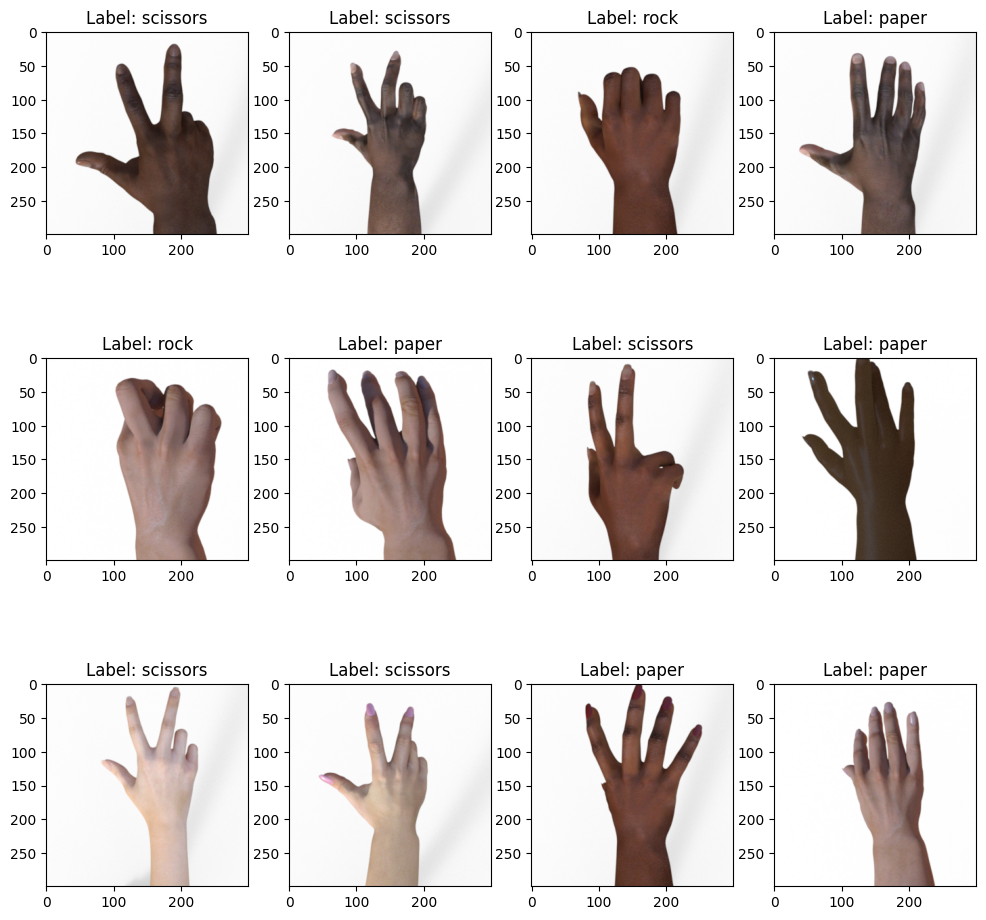

In [ ]:
# Explore the training dataset images.
preview_dataset(dataset_train)

In [ ]:
# Explore what values are used to represent the image.
(first_image, first_lable) = list(dataset_train.take(1))[0]
print('Label:', first_lable.numpy(), '\n')
print('Image shape:', first_image.numpy().shape, '\n')
print(first_image.numpy())

Label: 2 

Image shape: (300, 300, 3) 

[[[254 254 254]
  [253 253 253]
  [254 254 254]
  ...
  [251 251 251]
  [250 250 250]
  [250 250 250]]

 [[254 254 254]
  [254 254 254]
  [253 253 253]
  ...
  [250 250 250]
  [251 251 251]
  [249 249 249]]

 [[254 254 254]
  [254 254 254]
  [254 254 254]
  ...
  [251 251 251]
  [250 250 250]
  [252 252 252]]

 ...

 [[252 252 252]
  [251 251 251]
  [252 252 252]
  ...
  [247 247 247]
  [249 249 249]
  [248 248 248]]

 [[253 253 253]
  [253 253 253]
  [251 251 251]
  ...
  [248 248 248]
  [248 248 248]
  [248 248 248]]

 [[252 252 252]
  [253 253 253]
  [252 252 252]
  ...
  [248 248 248]
  [247 247 247]
  [250 250 250]]]


#Data Pre-processing

In this section, we format the image to have a value between 0 and 1.

In [ ]:
def format_example(image, label):
    # Make image color values to be float.
    image = tf.cast(image, tf.float32)
    # Make image color values to be in [0..1] range.
    image = image / 255.
    # Make sure that image has a right size
    image = tf.image.resize(image, [INPUT_IMG_SIZE, INPUT_IMG_SIZE])
    return image, label

In [ ]:
# call the format_example function on the train and test dataset
dataset_train = dataset_train.map(format_example)
dataset_test = dataset_test.map(format_example)

In [ ]:
# Check if the image values that are used to represent the data has been transformed.
(first_image, first_lable) = list(dataset_train.take(1))[0]
print('Label:', first_lable.numpy(), '\n')
print('Image shape:', first_image.numpy().shape, '\n')
print(first_image.numpy())

Label: 2 

Image shape: (150, 150, 3) 

[[[0.995098   0.995098   0.995098  ]
  [0.995098   0.995098   0.995098  ]
  [0.995098   0.995098   0.995098  ]
  ...
  [0.9852941  0.9852941  0.9852941 ]
  [0.9843137  0.9843137  0.9843137 ]
  [0.98039216 0.98039216 0.98039216]]

 [[0.99607843 0.99607843 0.99607843]
  [0.995098   0.995098   0.995098  ]
  [0.995098   0.995098   0.995098  ]
  ...
  [0.98333335 0.98333335 0.98333335]
  [0.9813726  0.9813726  0.9813726 ]
  [0.98333335 0.98333335 0.98333335]]

 [[0.99607843 0.99607843 0.99607843]
  [0.9941176  0.9941176  0.9941176 ]
  [0.9941176  0.9941176  0.9941176 ]
  ...
  [0.9852941  0.9852941  0.9852941 ]
  [0.9852941  0.9852941  0.9852941 ]
  [0.9813726  0.9813726  0.9813726 ]]

 ...

 [[0.9862745  0.9862745  0.9862745 ]
  [0.98725486 0.98725486 0.98725486]
  [0.9882353  0.9882353  0.9882353 ]
  ...
  [0.9705882  0.9705882  0.9705882 ]
  [0.97352946 0.97352946 0.97352946]
  [0.9754902  0.9754902  0.9754902 ]]

 [[0.9882353  0.9882353  0.9882353

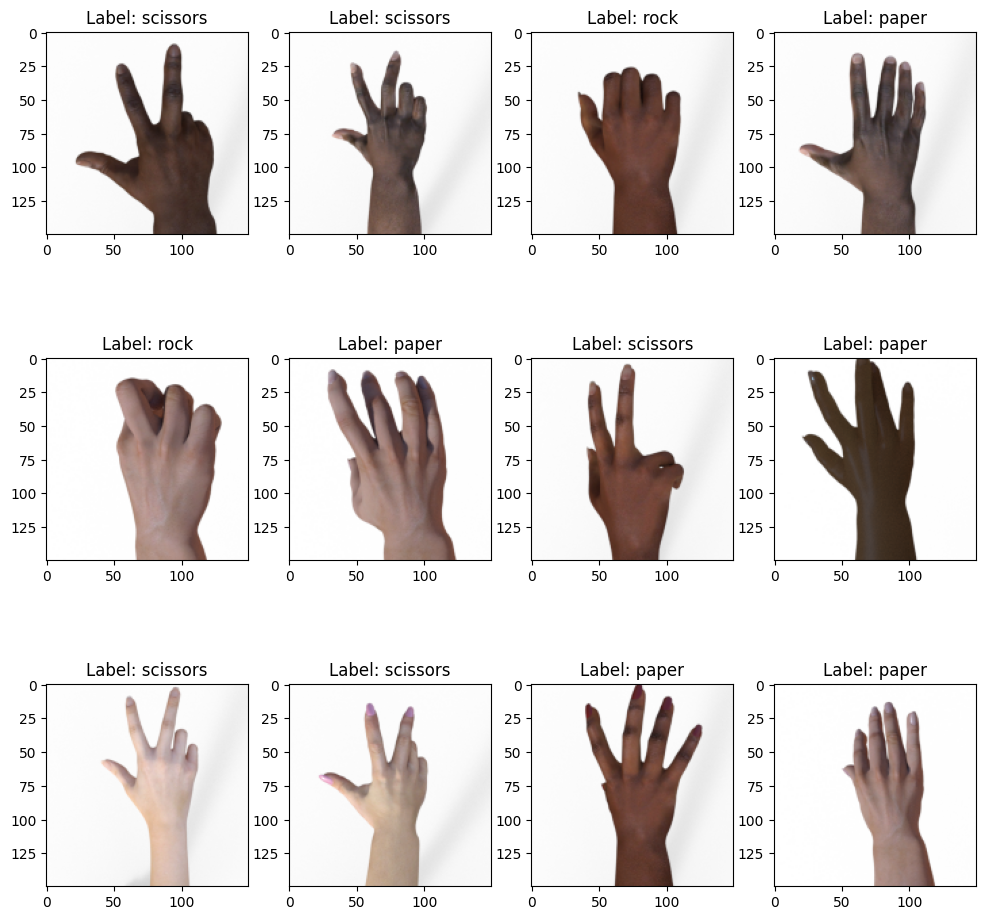

In [ ]:
# Explore preprocessed training dataset images.
preview_dataset(dataset_train)

#Data Augmentation

In this section, we perform data augmentation which is taking an image and performing various transformation on it to produce various variations of the same image. Below are the various augmentations applied on the training dataset:
* Rotation: Rotating images by a 90 degrees can help to improve the model's ability to recognize objects in different orientations.
* Horizontal flip: turning the image from left to right.
* Vertical flip: turning the image from up to down.
* Inversion: Inverting the colors of the image.
* Zooming the image.

It is important to note that image augmentation can also introduce noise into the training data, which can make it more difficult for the model to learn. Therefore, it is important to carefully select the augmentation techniques that are used and to monitor the model's performance during training.

In [ ]:
# This function takes an image tensor as input and returns a flipped image tensor.
def augment_flip(image: tf.Tensor) -> tf.Tensor:
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    return image

In [ ]:
# This function takes an image tensor as input and returns a color-augmented image tensor.
def augment_color(image: tf.Tensor) -> tf.Tensor:
    image = tf.image.random_hue(image, max_delta=0.08)
    image = tf.image.random_saturation(image, lower=0.7, upper=1.3)
    image = tf.image.random_brightness(image, 0.05)
    image = tf.image.random_contrast(image, lower=0.8, upper=1)
    image = tf.clip_by_value(image, clip_value_min=0, clip_value_max=1)
    return image

In [ ]:
# This function takes an image tensor as input and returns a 90 degree rotated image tensor.
def augment_rotation(image: tf.Tensor) -> tf.Tensor:
    # Rotate 0, 90, 180, 270 degrees
    return tf.image.rot90(
        image,
        tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32)
    )

In [ ]:
# This function takes an image tensor as input and returns an inverted image tensor.
def augment_inversion(image: tf.Tensor) -> tf.Tensor:
    random = tf.random.uniform(shape=[], minval=0, maxval=1)
    if random > 0.5:
        image = tf.math.multiply(image, -1)
        image = tf.math.add(image, 1)
    return image

In [ ]:
# This function takes an image tensor as input and returns a zoomed image tensor with a 50% chance of cropping occuring.
def augment_zoom(image: tf.Tensor, min_zoom=0.8, max_zoom=1.0) -> tf.Tensor:
    image_width, image_height, image_colors = image.shape
    crop_size = (image_width, image_height)

    # Generate crop settings, ranging from a 1% to 20% crop.
    scales = list(np.arange(min_zoom, max_zoom, 0.01))
    boxes = np.zeros((len(scales), 4))

    for i, scale in enumerate(scales):
        x1 = y1 = 0.5 - (0.5 * scale)
        x2 = y2 = 0.5 + (0.5 * scale)
        boxes[i] = [x1, y1, x2, y2]

    def random_crop(img):
        # Create different crops for an image
        crops = tf.image.crop_and_resize(
            [img],
            boxes=boxes,
            box_indices=np.zeros(len(scales)),
            crop_size=crop_size
        )
        # Return a random crop
        return crops[tf.random.uniform(shape=[], minval=0, maxval=len(scales), dtype=tf.int32)]

    choice = tf.random.uniform(shape=[], minval=0., maxval=1., dtype=tf.float32)

    # Only apply cropping 50% of the time
    return tf.cond(choice < 0.5, lambda: image, lambda: random_crop(image))

In [ ]:
# function that applies the various data augmentation techniques on an image
def augment_data(image, label):
    image = augment_flip(image)
    image = augment_color(image)
    image = augment_rotation(image)
    image = augment_zoom(image)
    image = augment_inversion(image)
    return image, label

In [ ]:
# apply the data augmentation on the training dataset
dataset_train_augmented = dataset_train.map(augment_data)

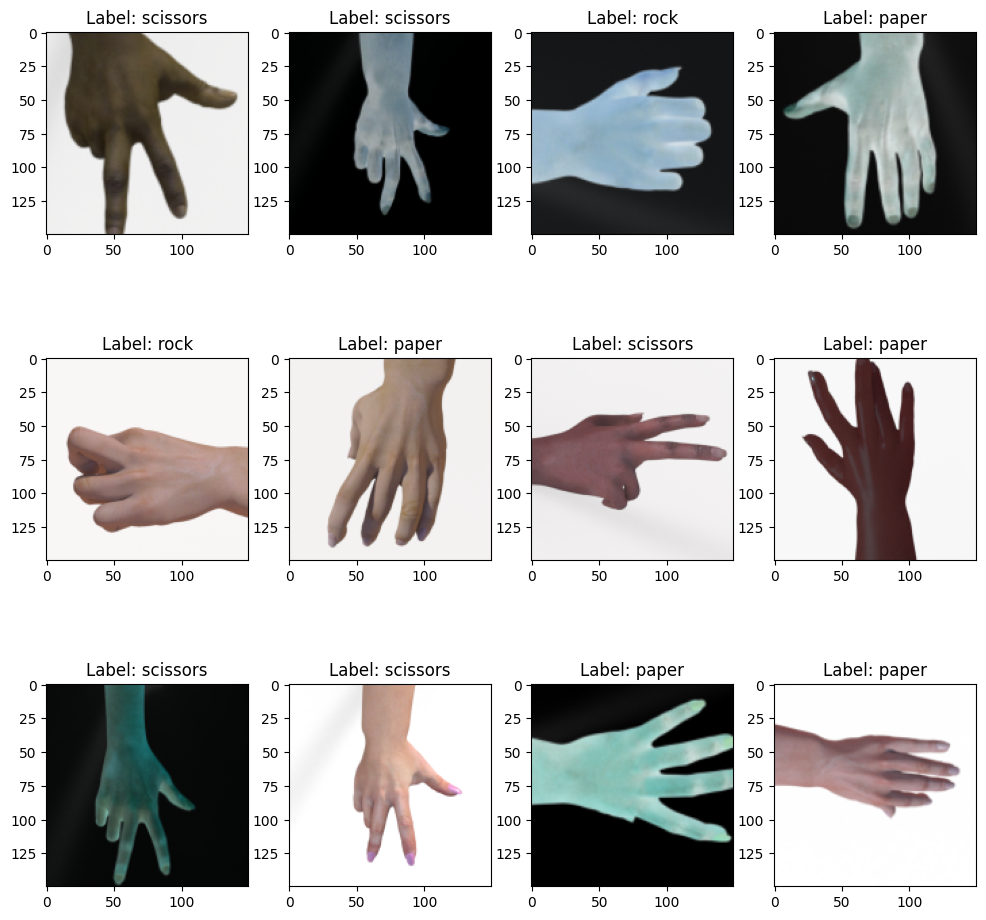

In [ ]:
# Explore augmented training dataset.
preview_dataset(dataset_train_augmented)

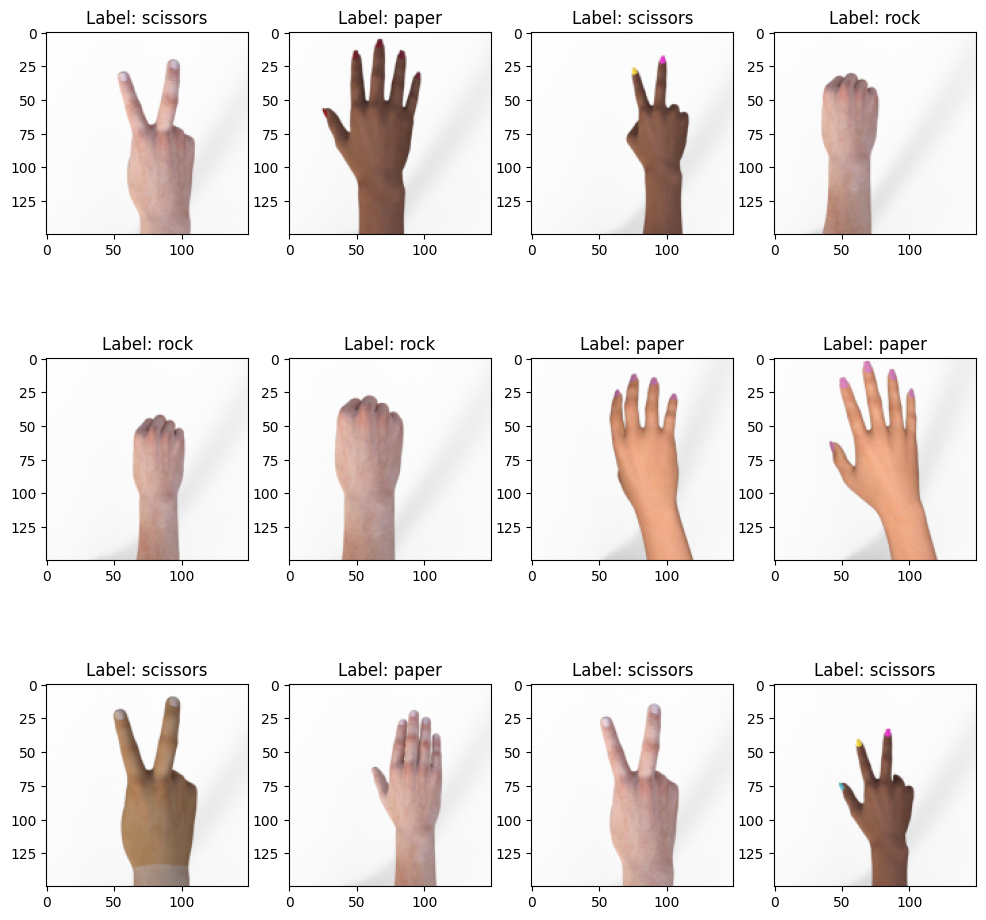

In [ ]:
# Explore test dataset.
preview_dataset(dataset_test)

#Data shuffling and batching

In this section we perform data shuffling and batching.
* Data shuffling is the process of randomly rearranging the order of the data in the dataset. This is done to prevent the model from learning patterns that are based on the order of the data.

* Batching on the otherhand is the process of grouping the data into small sets, called batches. Each batch is then passed to the model for training. Batching is done for two reasons. First, it allows the model to be trained more efficiently. Second, it helps to prevent the model from overfitting to the data. Overfitting occurs when the model learns the specific details of the training data, rather than the general patterns. By batching the data, the model is forced to learn to generalize to unseen data.

The size of the batch is a hyperparameter that can be tuned to improve the performance of the model. A larger batch size can improve the efficiency of training, but it can also increase the risk of overfitting. A smaller batch size can reduce the risk of overfitting, but it can also make training slower.

The optimal batch size depends on the specific model and the dataset. It is important to experiment with different batch sizes to find the one that works best for your specific application.

In [ ]:
BATCH_SIZE = 32

# shuffle the augmented train dataset
dataset_train_augmented_shuffled = dataset_train_augmented.shuffle(buffer_size=train_example_count)

# create batches of the shuffled augmented train dataset
dataset_train_augmented_shuffled = dataset_train_augmented.batch(batch_size=BATCH_SIZE)

# Prefetch will enable the input pipeline to asynchronously fetch batches while your model is training.
dataset_train_augmented_shuffled = dataset_train_augmented_shuffled.prefetch(
    buffer_size=tf.data.experimental.AUTOTUNE
)

# create batches for the test dataset
dataset_test_shuffled = dataset_test.batch(BATCH_SIZE)

In [ ]:
print(dataset_train_augmented_shuffled)
print(dataset_test_shuffled)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 150, 150, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>
<_BatchDataset element_spec=(TensorSpec(shape=(None, 150, 150, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>


Label batch shape: (32,) 

Image batch shape: (32, 150, 150, 3) 

Label batch: [2 2 0 1 0 1 2 1 2 2 1 1 2 1 1 1 1 1 1 1 1 0 0 0 0 1 1 2 2 2 0 0] 

First batch image: [[[0.06862551 0.07092547 0.07089412]
  [0.06865799 0.07095796 0.07092661]
  [0.06787372 0.07017374 0.07014233]
  ...
  [0.07327336 0.07557333 0.07554197]
  [0.0740298  0.07632983 0.07629848]
  [0.07409757 0.07639754 0.07636619]]

 [[0.06866121 0.07096118 0.07092983]
  [0.06867796 0.07097793 0.07094657]
  [0.0686298  0.07092977 0.07089841]
  ...
  [0.07632631 0.07862628 0.07859492]
  [0.07486582 0.07716584 0.07713443]
  [0.07483441 0.07713443 0.07710302]]

 [[0.0670712  0.06937122 0.06933987]
  [0.06933594 0.0716359  0.07160455]
  [0.06803602 0.07033604 0.07030463]
  ...
  [0.07435757 0.07665759 0.07662624]
  [0.07501566 0.07731569 0.07728428]
  [0.07652068 0.07882065 0.07878929]]

 ...

 [[0.07687914 0.07917911 0.07914776]
  [0.07604283 0.0783428  0.07831144]
  [0.07687199 0.07917196 0.0791406 ]
  ...
  [0.08938152 0.09168

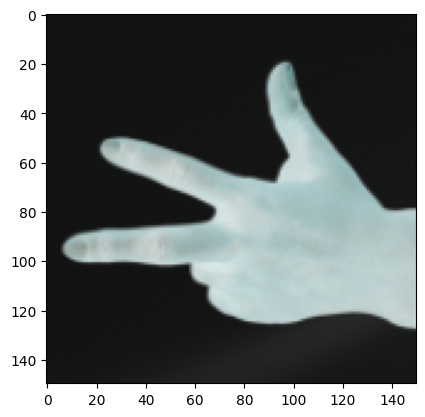

In [ ]:
# Debugging the batches using conversion to Numpy arrays.
batches = tfds.as_numpy(dataset_train_augmented_shuffled)
for batch in batches:
    image_batch, label_batch = batch
    print('Label batch shape:', label_batch.shape, '\n')
    print('Image batch shape:', image_batch.shape, '\n')
    print('Label batch:', label_batch, '\n')

    for batch_item_index in range(len(image_batch)):
        print('First batch image:', image_batch[batch_item_index], '\n')
        plt.imshow(image_batch[batch_item_index])
        plt.show()
        # Break to shorten the output.
        break
    # Break to shorten the output.
    break

#Creating and compiling the Model

In this section, we created a tensorflow sequential model object and added 4 convolution layers with an activation 'relu' to each layer, and then flatten the layers.
Then we use the RMS optimizer instead of adam optimizer during compiling, because it is best suited for handling noisy dataset.

In [ ]:
# use the tensorflow sequential model
model = tf.keras.models.Sequential()

# First convolution.
model.add(tf.keras.layers.Convolution2D(
    input_shape=INPUT_IMG_SHAPE,
    filters=64,
    kernel_size=3,
    activation=tf.keras.activations.relu
))
model.add(tf.keras.layers.MaxPooling2D(
    pool_size=(2, 2),
    strides=(2, 2)
))

# Second convolution.
model.add(tf.keras.layers.Convolution2D(
    filters=64,
    kernel_size=3,
    activation=tf.keras.activations.relu
))
model.add(tf.keras.layers.MaxPooling2D(
    pool_size=(2, 2),
    strides=(2, 2)
))

# Third convolution.
model.add(tf.keras.layers.Convolution2D(
    filters=128,
    kernel_size=3,
    activation=tf.keras.activations.relu
))
model.add(tf.keras.layers.MaxPooling2D(
    pool_size=(2, 2),
    strides=(2, 2)
))

# Fourth convolution.
model.add(tf.keras.layers.Convolution2D(
    filters=128,
    kernel_size=3,
    activation=tf.keras.activations.relu
))
model.add(tf.keras.layers.MaxPooling2D(
    pool_size=(2, 2),
    strides=(2, 2)
))

# Flatten the results to feed into dense layers.
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dropout(0.5))

# 512 neuron dense layer.
model.add(tf.keras.layers.Dense(
    units=512,
    activation=tf.keras.activations.relu
))

# Output layer.
model.add(tf.keras.layers.Dense(
    units=num_of_classes,
    activation=tf.keras.activations.softmax
))

In [ ]:
# get the model summary
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 148, 148, 64)      1792      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 74, 74, 64)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 72, 72, 64)        36928     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 17, 17, 128)     

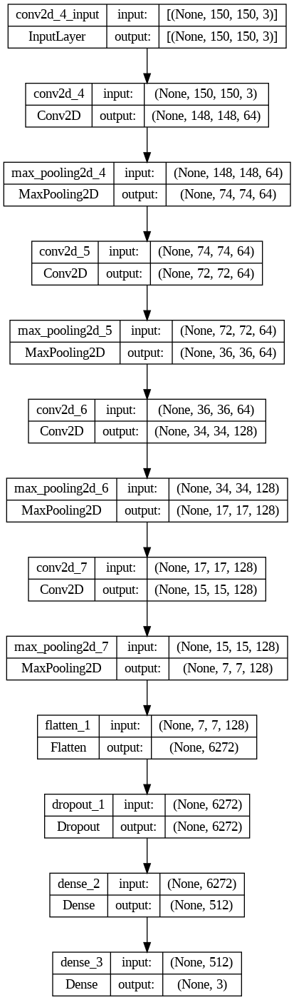

In [ ]:
# plot the architecture of a Keras model. The function takes the model as input and outputs a graphviz diagram of the model.
tf.keras.utils.plot_model(
    model,
    show_shapes=True,
    show_layer_names=True,
)

# Compiling the Model

In [ ]:
# RMSProp is a popular optimizer that is known for its ability to handle noisy data.
rmsprop_optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.001,rho=0.9, momentum=0.0, epsilon=1e-07, centered=False,
                                                weight_decay=None, clipnorm=None, clipvalue=None, global_clipnorm=None,
                                                use_ema=False, ema_momentum=0.99, ema_overwrite_frequency=100, jit_compile=True)

model.compile(
    optimizer = rmsprop_optimizer,
    loss=tf.keras.losses.sparse_categorical_crossentropy,
    metrics=['accuracy']
)

#Training the Model

In [ ]:
# the steps will be the number of train example divided by the batch size
steps_per_epoch = train_example_count // BATCH_SIZE

# the validation steps will be the number of test example divided by the batch size
validation_steps = test_example_count // BATCH_SIZE

print('steps_per_epoch:', steps_per_epoch)
print('validation_steps:', validation_steps)

steps_per_epoch: 78
validation_steps: 11


In [ ]:
# clear any file log that occured during runtime
!rm -rf tmp/checkpoints
!rm -rf logs

In [ ]:
# Preparing 3 callbacks which includes monitoring the history, checking the weights during training ,and the accuracy used for early stopping.
os.makedirs('logs/fit', exist_ok=True)
tensorboard_log_dir = 'logs/fit/' + datetime.datetime.now().strftime('%Y%m%d-%H%M%S')

# callback that can be used to visualize the training process of a Keras model.
# The callback creates a TensorBoard dashboard that can be used to track the model's loss, accuracy, and other metrics over time.
tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir=tensorboard_log_dir,
    histogram_freq=1
)

# create a directory called tmp/checkpoints
os.makedirs('tmp/checkpoints', exist_ok=True)

# The ModelCheckpoint callback object will save the model's weights to the tmp/checkpoints directory at the end of each epoch.
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    #  The filename of the saved weights file will be weights.{epoch:02d}-{val_loss:.2f}.hdf5.
    filepath='tmp/checkpoints/weights.{epoch:02d}-{val_loss:.2f}.hdf5'
)

early_stopping_callback = tf.keras.callbacks.EarlyStopping(
    # The number of epochs with no improvement after which training will be stopped.
    patience=5,
    # The metric to monitor for early stopping.
    monitor='val_accuracy'
)

In [ ]:
training_history = model.fit(
    x=dataset_train_augmented_shuffled.repeat(),
    validation_data=dataset_test_shuffled.repeat(),
    epochs=15,
    steps_per_epoch=steps_per_epoch,
    validation_steps=validation_steps,
    callbacks=[
        # model_checkpoint_callback,
        early_stopping_callback,
        tensorboard_callback
    ],
    verbose=1
)

Epoch 1/15
78/78 [==============================] - 238s 3s/step - loss: 1.1334 - accuracy: 0.3826 - val_loss: 1.0450 - val_accuracy: 0.4886
Epoch 2/15
78/78 [==============================] - 231s 3s/step - loss: 0.7157 - accuracy: 0.7078 - val_loss: 0.8099 - val_accuracy: 0.5881
Epoch 3/15
78/78 [==============================] - 228s 3s/step - loss: 0.4088 - accuracy: 0.8412 - val_loss: 0.4030 - val_accuracy: 0.7955
Epoch 4/15
78/78 [==============================] - 224s 3s/step - loss: 0.2398 - accuracy: 0.9180 - val_loss: 0.3998 - val_accuracy: 0.7926
Epoch 5/15
78/78 [==============================] - 226s 3s/step - loss: 0.1882 - accuracy: 0.9349 - val_loss: 0.2695 - val_accuracy: 0.8778
Epoch 6/15
78/78 [==============================] - 225s 3s/step - loss: 0.1572 - accuracy: 0.9526 - val_loss: 0.2123 - val_accuracy: 0.8920
Epoch 7/15
78/78 [==============================] - 225s 3s/step - loss: 0.1117 - accuracy: 0.9642 - val_loss: 0.1555 - val_accuracy: 0.9119
Epoch 8/15
78

In [ ]:
# plot the training history of the model
def render_training_history(training_history):
    loss = training_history.history['loss']
    val_loss = training_history.history['val_loss']

    accuracy = training_history.history['accuracy']
    val_accuracy = training_history.history['val_accuracy']

    plt.figure(figsize=(14, 4))

    plt.subplot(1, 2, 1)
    plt.title('Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.plot(loss, label='Training set')
    plt.plot(val_loss, label='Test set', linestyle='--')
    plt.legend()
    plt.grid(linestyle='--', linewidth=1, alpha=0.5)

    plt.subplot(1, 2, 2)
    plt.title('Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.plot(accuracy, label='Training set')
    plt.plot(val_accuracy, label='Test set', linestyle='--')
    plt.legend()
    plt.grid(linestyle='--', linewidth=1, alpha=0.5)

    plt.show()

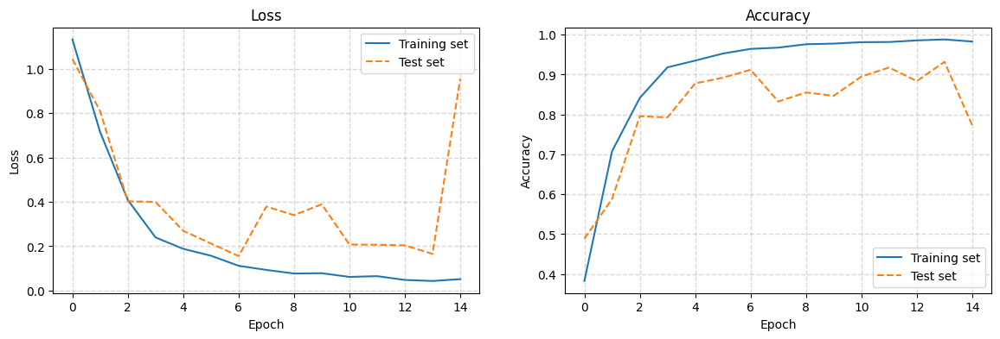

In [ ]:
render_training_history(training_history)

#Debugging the training with Tensorboard

In [ ]:
# didplay the tensorboard from the logdir
%tensorboard --logdir logs/fit

Reusing TensorBoard on port 6006 (pid 18734), started 1:13:21 ago. (Use '!kill 18734' to kill it.)

<IPython.core.display.Javascript object>

#Evaluating the Model Accuracy


To evaluate the model, we will use the evaluate() method. The evaluate() method takes one arguement, which is the test data. The evaluate() method returns a dictionary of metrics, including the accuracy.



In [ ]:
# use the testig data to erform evaluatio
test_loss, test_accuracy = model.evaluate(
    x=dataset_test.batch(BATCH_SIZE).take(test_example_count)
)

12/12 [==============================] - 9s 729ms/step - loss: 0.9671 - accuracy: 0.7742


In [ ]:
print('Test loss: ', test_loss)
print('\n')
print('Test accuracy: ', test_accuracy)

Test loss:  0.9670534729957581


Test accuracy:  0.774193525314331


#Saving the Model

In [ ]:
model_name = 'rock_paper_scissors.h5'
model.save(model_name, save_format='h5')

#Testing the saved Model using an uploaded Image

In [ ]:
# Load the pre-trained model
rock_paper_scissors = tf.keras.models.load_model('rock_paper_scissors.h5')

Saving hand-do-rock-paper-scissors-260nw-621891809.webp to hand-do-rock-paper-scissors-260nw-621891809 (1).webp
1/1 [==============================] - 0s 117ms/step
[[0. 1. 0.]]
paper


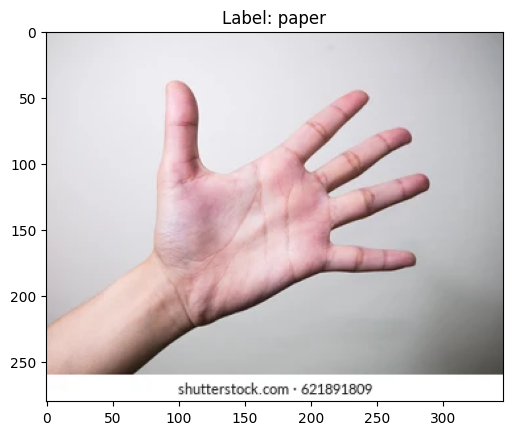

In [ ]:
from google.colab import files

# Prompt the user to select an image file
uploaded = files.upload()

# Convert the uploaded variable to a list
uploaded_list = list(uploaded)

# Get the name of the uploaded file
image_file = uploaded_list[0]

# Load the image
image = cv2.imread(image_file)

# Resize the image
resized_image = cv2.resize(image, (150, 150))

# Add a dimension to the image tensor
reshape_image = tf.expand_dims(resized_image, axis=0)

# Predict the class of the image
prediction = rock_paper_scissors.predict(reshape_image)

# Print the prediction
print(prediction)

# Get the class names
class_names = ["scissors", "paper", "rock"]

# Get the index of the predicted class
index = np.argmax(prediction)

# Get the predicted class name
predicted_class_name = class_names[index]

# Print the predicted class name
print(predicted_class_name)

# Load the image
pred_img = plt.imread(image_file)

# Display the image
plt.imshow(pred_img)
plt.title('Label: %s' % predicted_class_name)
plt.show()


--------------------------------------------------------------------------------------------------------------------------------------------